In [5]:
model_path='/home/_sergei/DataspellProjects/vein-segmentation/data/26/code/train/runs/segment/vein_segmentation_model10/weights/best.pt'

In [2]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

In [3]:
def load_model(model_path):
    try:
        model = YOLO(model_path)
        print(f"Model loaded successfully from {model_path}")
        return model
    except Exception as e:
        print(f"Error loading model: {str(e)}")
        return None

In [4]:
def predict_and_visualize(model, image_path):
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Unable to load image from {image_path}")
            return

        results = model(image)

        orig_img = results[0].orig_img

        if len(results[0].masks) > 0:
            masks = results[0].masks.data.cpu().numpy()
            mask = np.max(masks, axis=0)  # Комбинируем все маски
        else:
            print("No segmentation masks found in the prediction.")
            mask = np.zeros(orig_img.shape[:2])

        # Визуализация
        plt.figure(figsize=(12, 6))
        
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
        plt.imshow(mask, alpha=0.5, cmap='jet')
        plt.title("Segmentation Mask")
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error during prediction and visualization: {str(e)}")

In [6]:
model = load_model(model_path)

Model loaded successfully from /home/_sergei/DataspellProjects/vein-segmentation/data/26/code/train/runs/segment/vein_segmentation_model10/weights/best.pt


Processing image: photo no checkersboard (45).jpg

0: 512x384 3 veins, 49.8ms
Speed: 2.6ms preprocess, 49.8ms inference, 141.7ms postprocess per image at shape (1, 3, 512, 384)


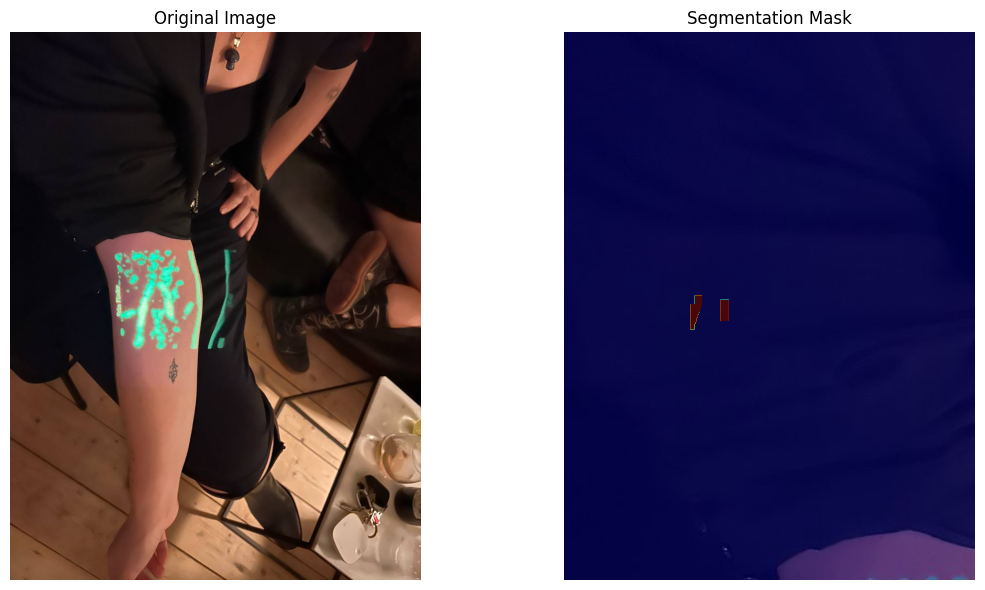

Processing image: photo no checkersboard (42).jpg

0: 512x384 (no detections), 5.1ms
Speed: 1.8ms preprocess, 5.1ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 384)
Error during prediction and visualization: object of type 'NoneType' has no len()
Processing image: photo no checkersboard (48).jpg

0: 512x384 1 vein, 7.3ms
Speed: 2.0ms preprocess, 7.3ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 384)


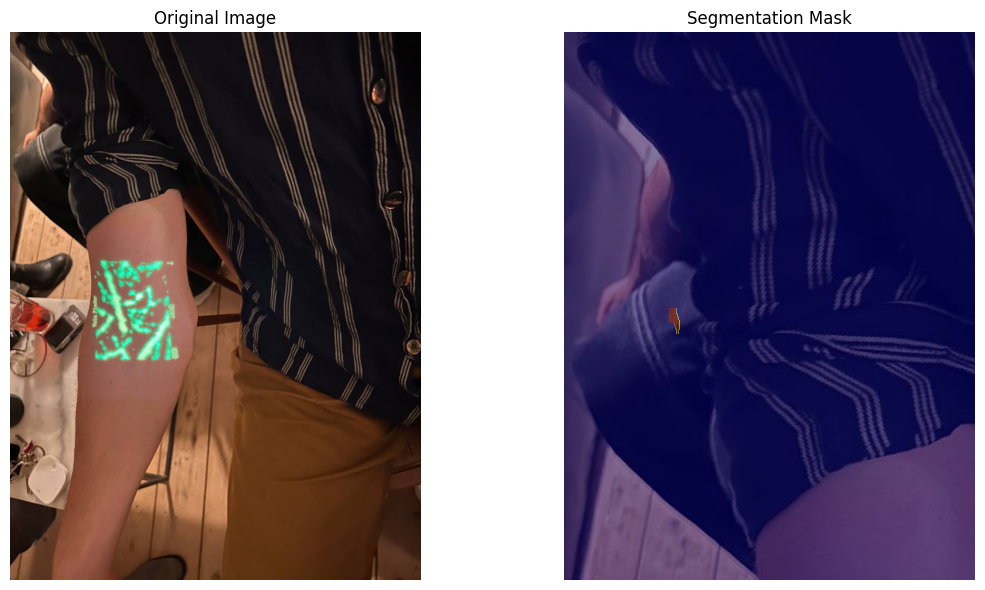

Processing image: photo no checkersboard (14).jpg

0: 512x384 1 vein, 4.7ms
Speed: 1.5ms preprocess, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 384)


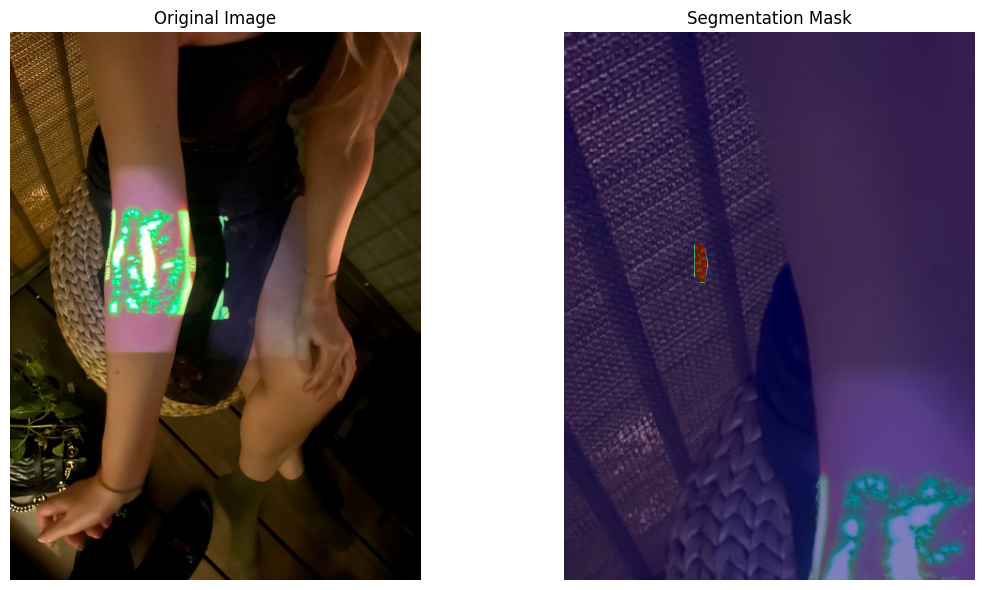

Processing image: photo no checkersboard (26).jpg

0: 512x384 (no detections), 4.7ms
Speed: 2.4ms preprocess, 4.7ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 384)
Error during prediction and visualization: object of type 'NoneType' has no len()
Processing image: photo no checkersboard (33).jpg

0: 512x384 (no detections), 4.5ms
Speed: 1.3ms preprocess, 4.5ms inference, 0.3ms postprocess per image at shape (1, 3, 512, 384)
Error during prediction and visualization: object of type 'NoneType' has no len()
Processing image: photo no checkersboard (19).jpg

0: 512x384 2 veins, 4.3ms
Speed: 1.3ms preprocess, 4.3ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 384)


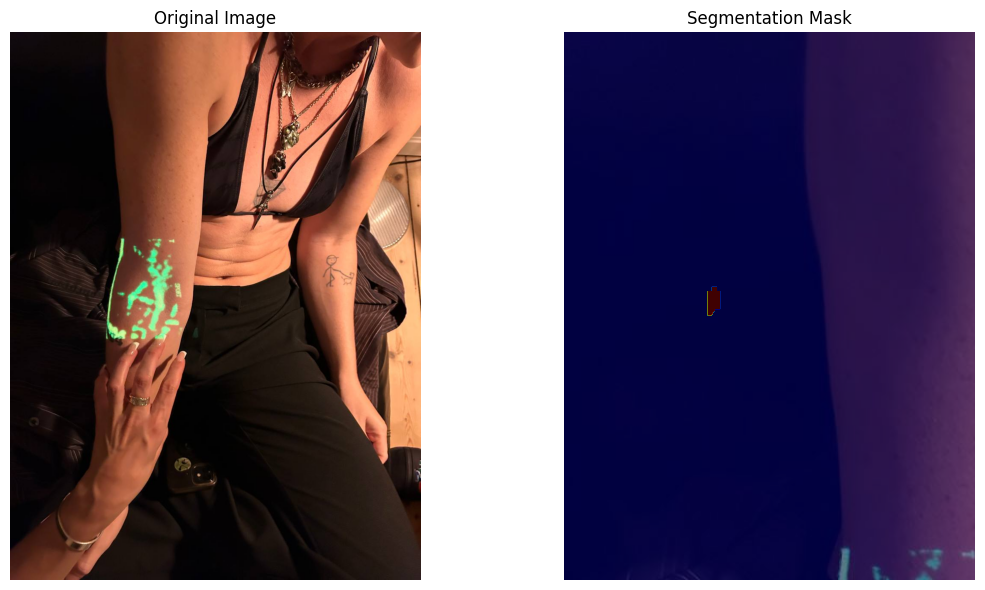

Processing image: photo no checkersboard (34).jpg

0: 512x384 2 veins, 4.6ms
Speed: 1.7ms preprocess, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 384)


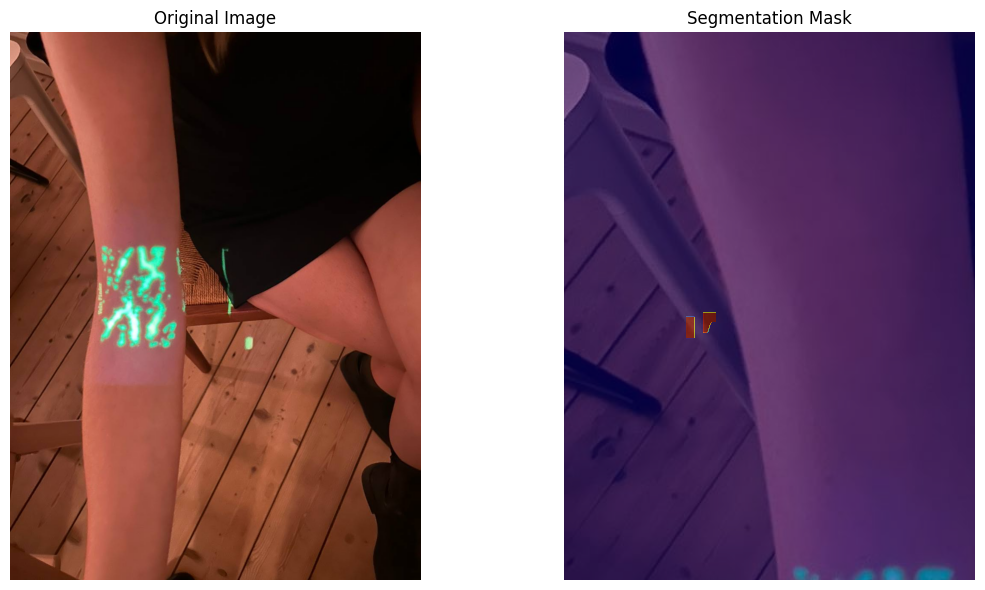

Processing image: photo no checkersboard (4).jpg

0: 512x384 1 vein, 5.6ms
Speed: 1.8ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 384)


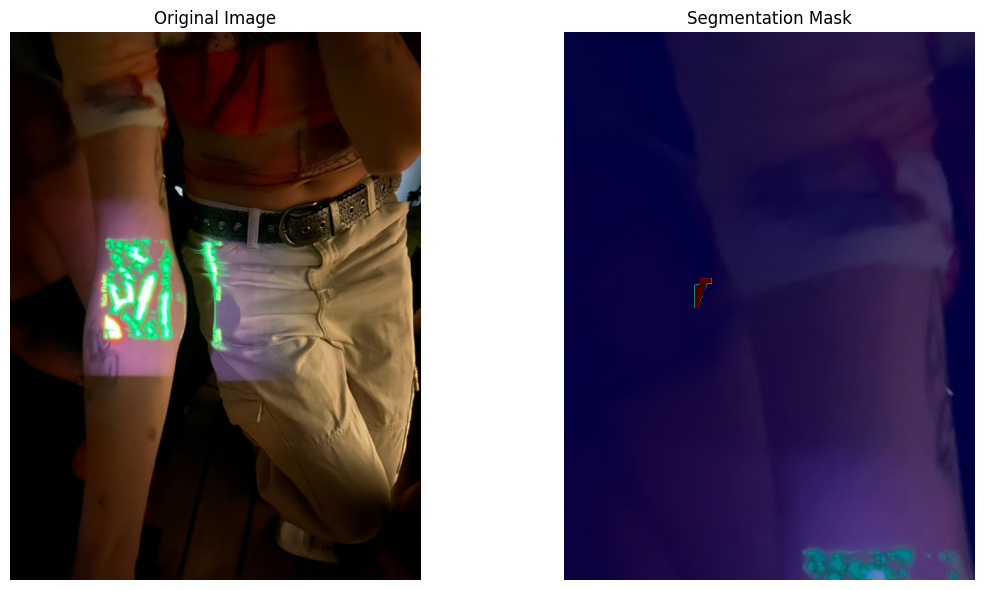

Processing image: photo no checkersboard (32).jpg

0: 512x384 1 vein, 4.3ms
Speed: 1.7ms preprocess, 4.3ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 384)


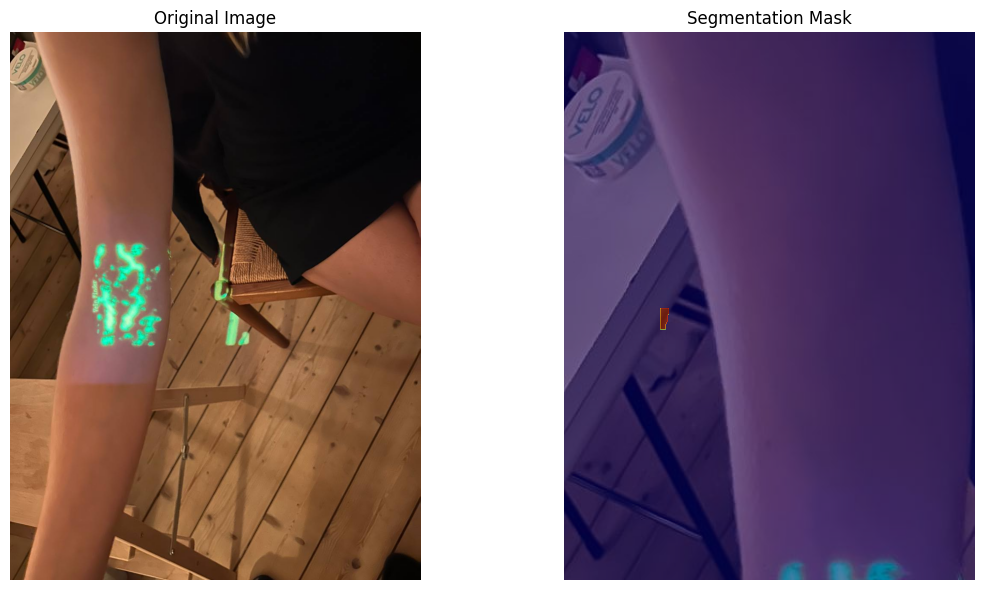

Processing image: photo no checkersboard (15).jpg

0: 512x384 2 veins, 4.8ms
Speed: 1.7ms preprocess, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 384)


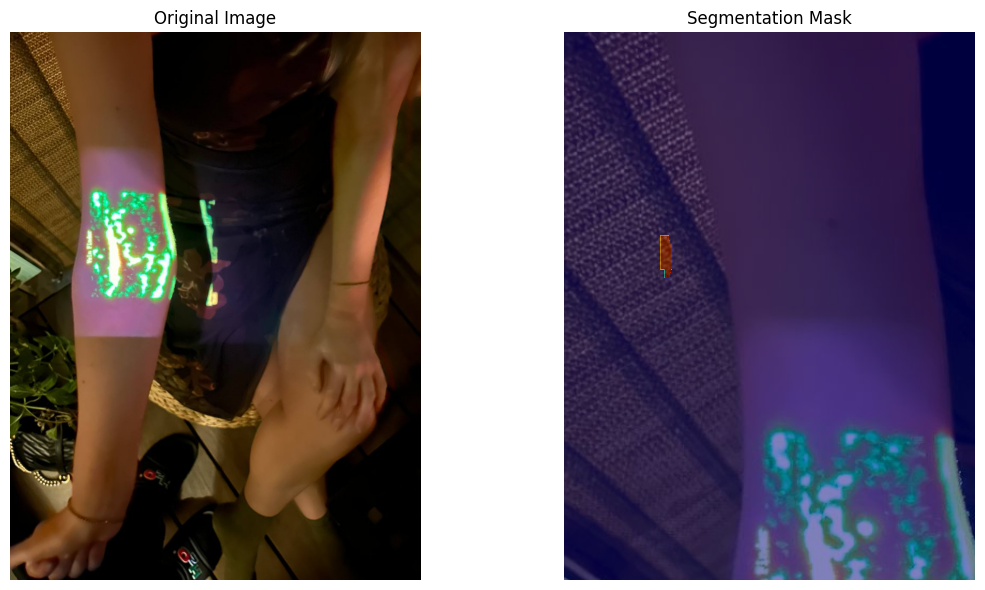

In [7]:
if model is not None:
    test_dir = "/home/_sergei/DataspellProjects/vein-segmentation/data/22/dataset/test/images"

    image_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    for image_file in image_files:
        image_path = os.path.join(test_dir, image_file)
        print(f"Processing image: {image_file}")
        predict_and_visualize(model, image_path)
else:
    print("Failed to load the model. Please check the model path and try again.")

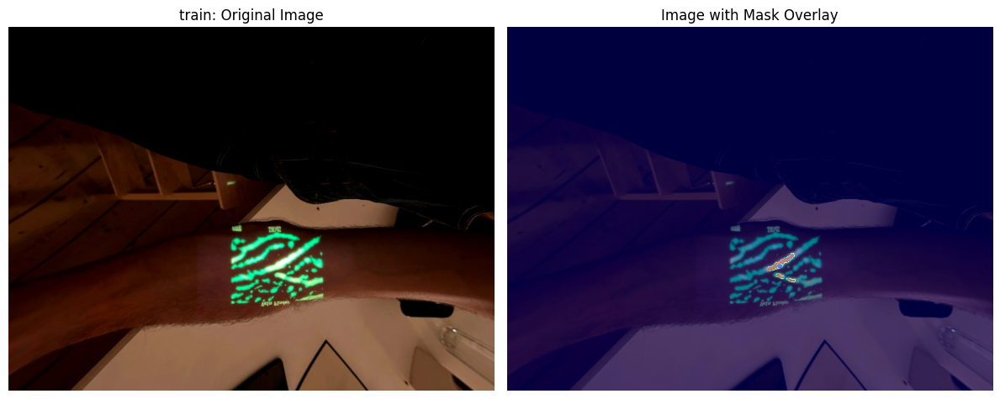

Visualized: vein_train_0017_aug_07.jpg
Label file: vein_train_0017_aug_07.txt
---


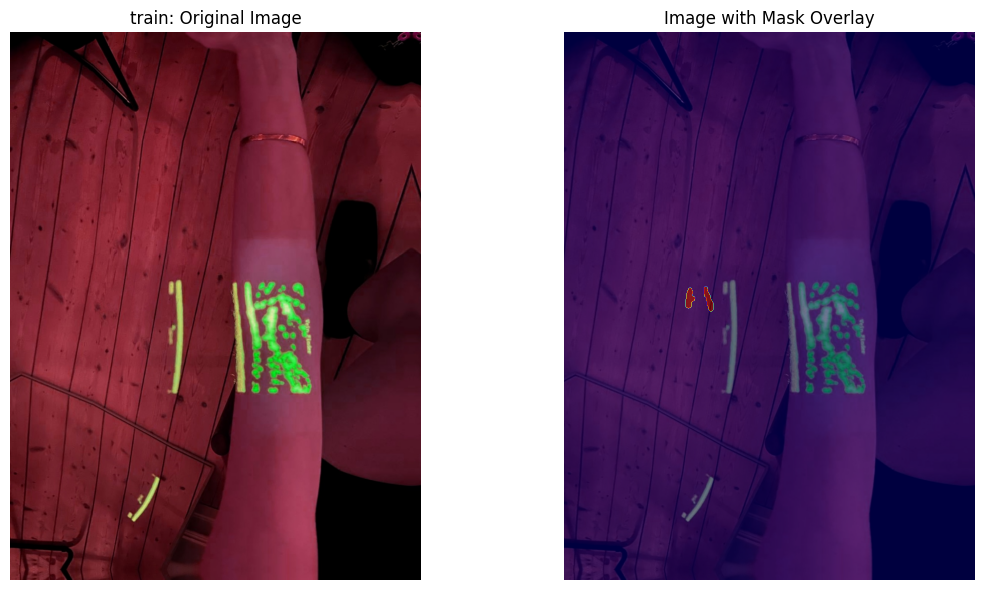

Visualized: vein_train_0027_aug_01.jpg
Label file: vein_train_0027_aug_01.txt
---


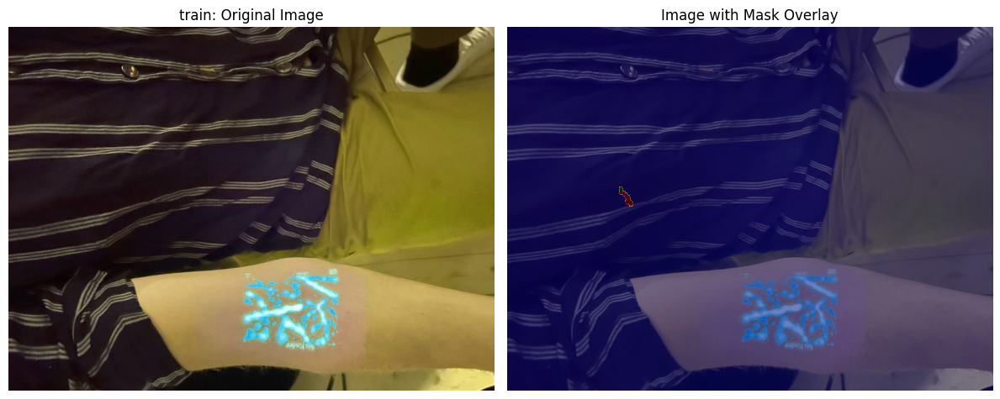

Visualized: vein_train_0026_aug_01.jpg
Label file: vein_train_0026_aug_01.txt
---


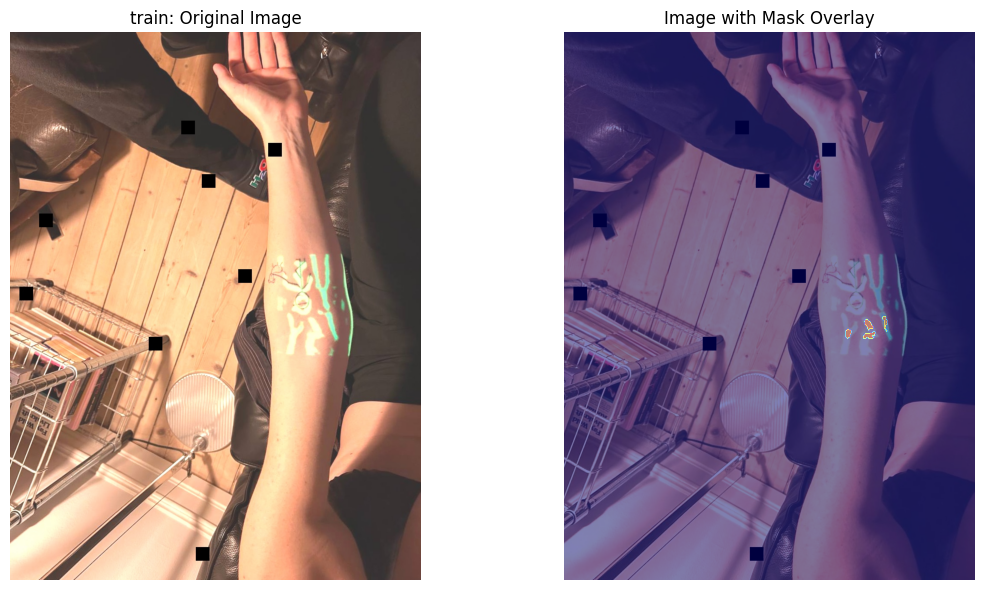

Visualized: vein_train_0010_aug_07.jpg
Label file: vein_train_0010_aug_07.txt
---


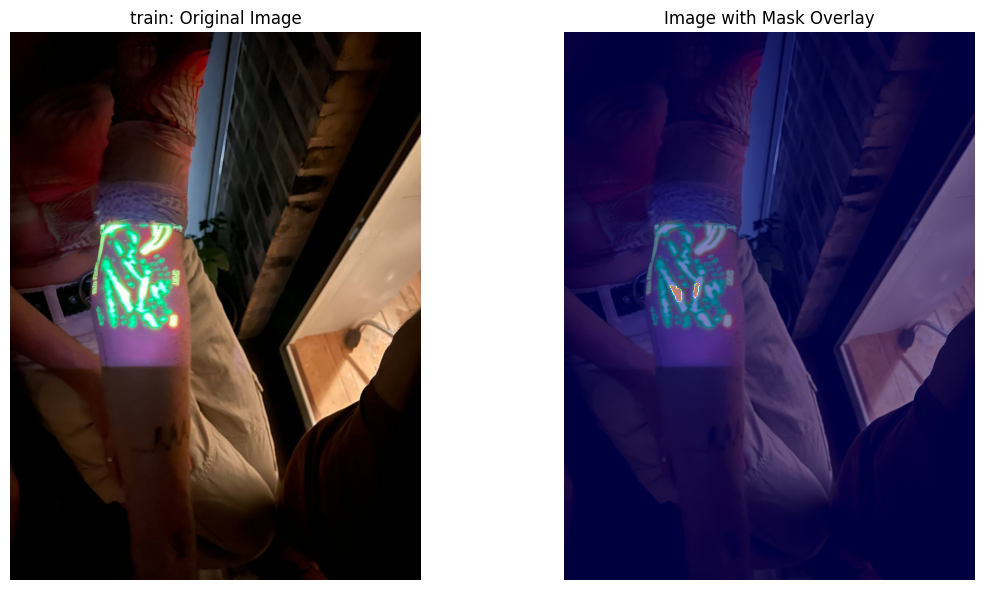

Visualized: vein_train_0013_aug_00.jpg
Label file: vein_train_0013_aug_00.txt
---


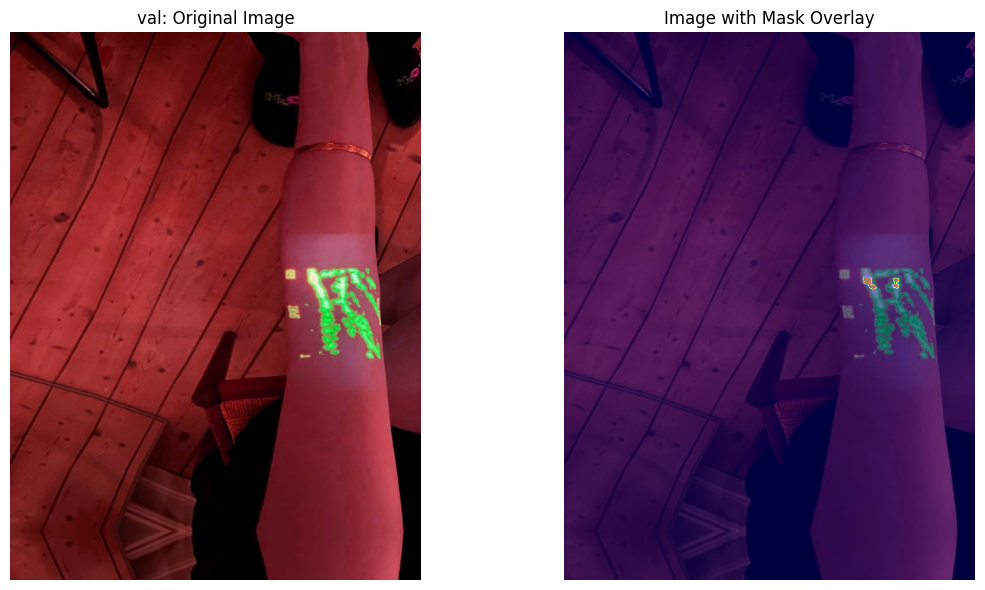

Visualized: vein_val_0004_aug_08.jpg
Label file: vein_val_0004_aug_08.txt
---


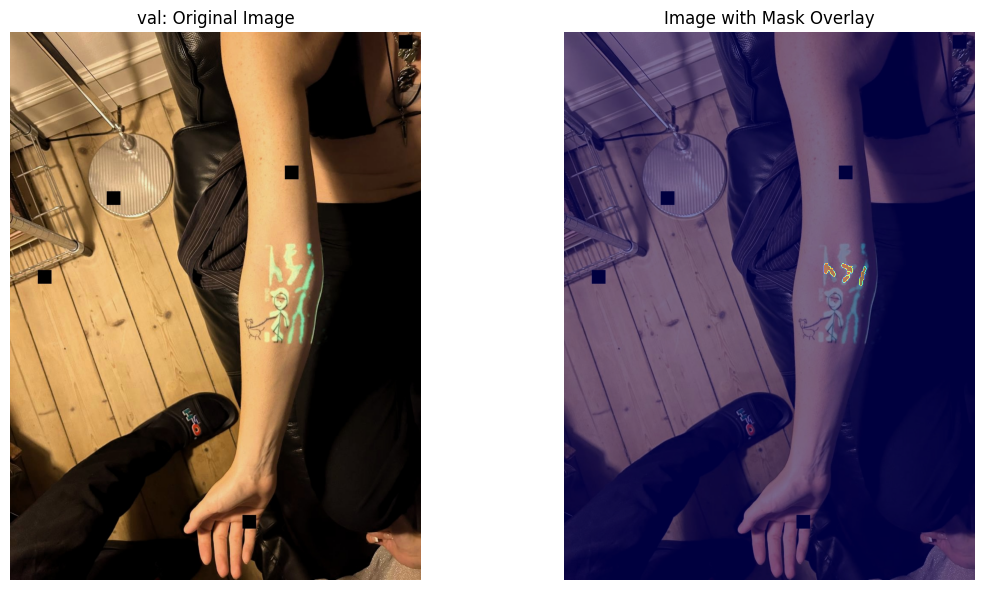

Visualized: vein_val_0002_aug_05.jpg
Label file: vein_val_0002_aug_05.txt
---


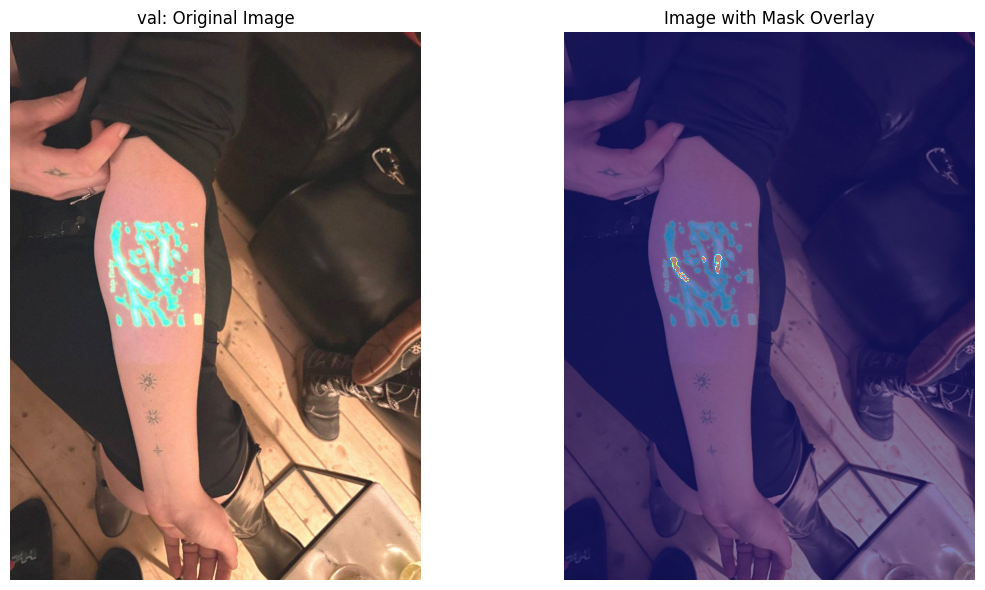

Visualized: vein_val_0003_aug_10.jpg
Label file: vein_val_0003_aug_10.txt
---


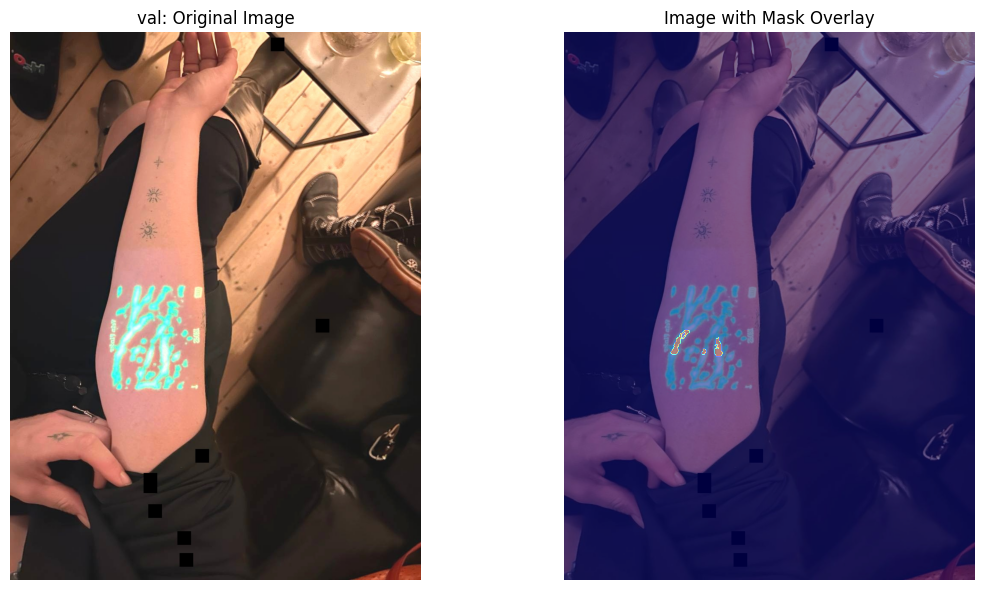

Visualized: vein_val_0003_aug_04.jpg
Label file: vein_val_0003_aug_04.txt
---


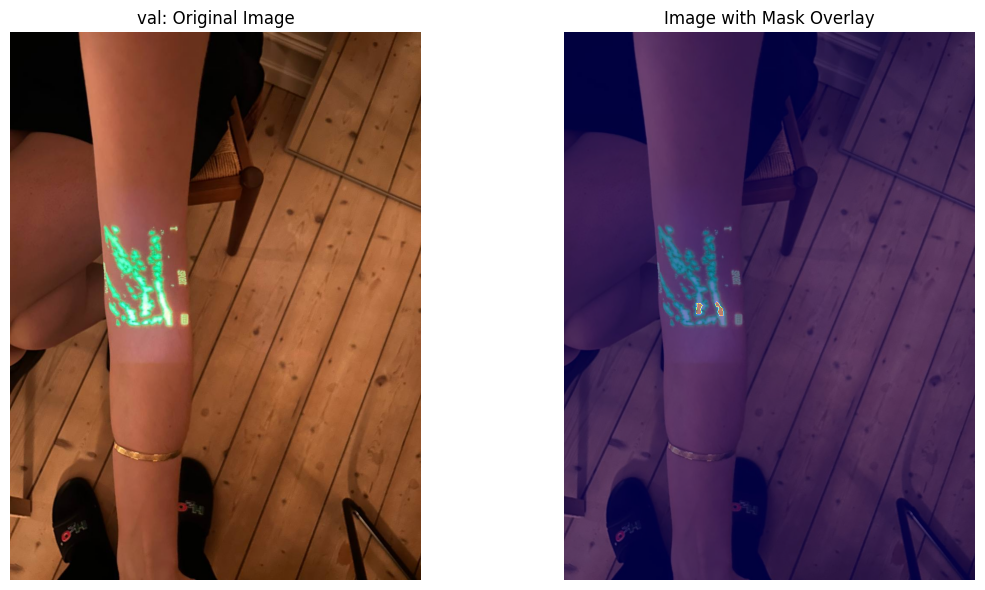

Visualized: vein_val_0004_aug_00.jpg
Label file: vein_val_0004_aug_00.txt
---


In [8]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

def visualize_yolo_dataset(dataset_path, num_samples=5):
    for subset in ['train', 'val']:
        images_dir = os.path.join(dataset_path, 'images', subset)
        labels_dir = os.path.join(dataset_path, 'labels', subset)
        
        image_files = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        samples = random.sample(image_files, min(num_samples, len(image_files)))
        
        for image_file in samples:
            image_path = os.path.join(images_dir, image_file)
            label_file = os.path.splitext(image_file)[0] + '.txt'
            label_path = os.path.join(labels_dir, label_file)
            
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            mask = np.zeros(image.shape[:2], dtype=np.uint8)
            
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        class_id = int(parts[0])
                        polygon = np.array([float(x) for x in parts[1:]]).reshape(-1, 2)
                        
                        polygon[:, 0] *= image.shape[1]
                        polygon[:, 1] *= image.shape[0]
                        
                        cv2.fillPoly(mask, [polygon.astype(int)], color=(255))
            
            plt.figure(figsize=(12, 6))
            
            plt.subplot(1, 2, 1)
            plt.imshow(image)
            plt.title(f"{subset}: Original Image")
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(image)
            plt.imshow(mask, alpha=0.5, cmap='jet')
            plt.title("Image with Mask Overlay")
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()
            
            print(f"Visualized: {image_file}")
            print(f"Label file: {label_file}")
            print("---")

dataset_path = "/home/_sergei/DataspellProjects/vein-segmentation/data/26/yolo_dataset"
visualize_yolo_dataset(dataset_path, num_samples=5)